##Importing Required Libraries

In [0]:
import pandas as pd
!pip install geopandas
!pip install --upgrade pip
from pyspark.sql import SparkSession
from pyspark.sql.functions import count, col, when
from pyspark.sql.functions import udf
from pyspark.sql.types import StringType
!pip install pycountry-convert
import pycountry_convert as pc
from pyspark.sql.functions import collect_list
import matplotlib.pyplot as plt
from pyspark.sql.functions import count
import seaborn as sns
import matplotlib.pyplot as plt
from pyspark.sql.functions import desc, avg  
!pip install altair
import altair as alt
from pyspark.sql.functions import avg, first
from pyspark.sql.window import Window
import geopandas as gpd
import matplotlib.pyplot as plt
from pyspark.sql import functions as F



In [0]:
display(dbutils.fs.ls('./'))


path,name,size,modificationTime
dbfs:/FileStore/,FileStore/,0,0
dbfs:/databricks-datasets/,databricks-datasets/,0,0
dbfs:/databricks-results/,databricks-results/,0,0
dbfs:/delta/,delta/,0,0
dbfs:/user/,user/,0,0


In [0]:
display(dbutils.fs.ls('/databricks-datasets'))

path,name,size,modificationTime
dbfs:/databricks-datasets/COVID/,COVID/,0,0
dbfs:/databricks-datasets/README.md,README.md,976,1532468253000
dbfs:/databricks-datasets/Rdatasets/,Rdatasets/,0,0
dbfs:/databricks-datasets/SPARK_README.md,SPARK_README.md,3359,1455043490000
dbfs:/databricks-datasets/adult/,adult/,0,0
dbfs:/databricks-datasets/airlines/,airlines/,0,0
dbfs:/databricks-datasets/amazon/,amazon/,0,0
dbfs:/databricks-datasets/asa/,asa/,0,0
dbfs:/databricks-datasets/atlas_higgs/,atlas_higgs/,0,0
dbfs:/databricks-datasets/bikeSharing/,bikeSharing/,0,0


In [0]:
display(dbutils.fs.ls('dbfs:/FileStore'))


path,name,size,modificationTime
dbfs:/FileStore/ait_614_project.csv,ait_614_project.csv,1630847,1714245410000
dbfs:/FileStore/shared_uploads/,shared_uploads/,0,0
dbfs:/FileStore/tables/,tables/,0,0


###Reading the Dataset, Summary Statistics

In [0]:
# load the file using Spark
df = spark.read.format('csv').load(
  'dbfs:/FileStore/ait_614_project.csv',
  header=True,
  inferSchema=True
)
# summarize the dataset
dbutils.data.summarize(df)

<!DOCTYPE html>

In [0]:

# Display the contents of the DataFrame
display(df)

country_name,city_name,aqi_value,aqi_category,co_aqi_value,co_aqi_category,ozone_aqi_value,ozone_aqi_category,no2_aqi_value,no2_aqi_category,pm2.5_aqi_value,pm2.5_aqi_category
Russian Federation,Praskoveya,51,Moderate,1,Good,36,Good,0,Good,51,Moderate
Brazil,Presidente Dutra,41,Good,1,Good,5,Good,1,Good,41,Good
Italy,Priolo Gargallo,66,Moderate,1,Good,39,Good,2,Good,66,Moderate
Poland,Przasnysz,34,Good,1,Good,34,Good,0,Good,20,Good
France,Punaauia,22,Good,0,Good,22,Good,0,Good,6,Good
United States of America,Punta Gorda,54,Moderate,1,Good,14,Good,11,Good,54,Moderate
Germany,Puttlingen,62,Moderate,1,Good,35,Good,3,Good,62,Moderate
Belgium,Puurs,64,Moderate,1,Good,29,Good,7,Good,64,Moderate
Russian Federation,Pyatigorsk,54,Moderate,1,Good,41,Good,1,Good,54,Moderate
Egypt,Qalyub,142,Unhealthy for Sensitive Groups,3,Good,89,Moderate,9,Good,142,Unhealthy for Sensitive Groups


In [0]:
#checing for columns
df.columns 


Out[9]: ['country_name',
 'city_name',
 'aqi_value',
 'aqi_category',
 'co_aqi_value\t',
 'co_aqi_category',
 'ozone_aqi_value',
 'ozone_aqi_category',
 'no2_aqi_value',
 'no2_aqi_category',
 'pm2.5_aqi_value',
 'pm2.5_aqi_category']

In [0]:
#checking for null values
null=df.filter(df["country_name"].isNull())
display(null)



country_name,city_name,aqi_value,aqi_category,co_aqi_value,co_aqi_category,ozone_aqi_value,ozone_aqi_category,no2_aqi_value,no2_aqi_category,pm2.5_aqi_value,pm2.5_aqi_category
null,Granville,30,Good,1,Good,30,Good,3,Good,25,Good
null,Kingston Upon Hull,33,Good,1,Good,17,Good,8,Good,33,Good
null,New Waterford,20,Good,1,Good,18,Good,9,Good,20,Good
null,Kingstown,163,Unhealthy,0,Good,25,Good,0,Good,163,Unhealthy
null,Nanakuli,30,Good,0,Good,27,Good,0,Good,30,Good
null,Lavagna,55,Moderate,1,Good,38,Good,2,Good,55,Moderate
null,Ladispoli,48,Good,1,Good,48,Good,2,Good,34,Good
null,Dong Hoi,55,Moderate,0,Good,26,Good,0,Good,55,Moderate
null,Nettuno,53,Moderate,1,Good,53,Moderate,1,Good,23,Good
null,Puebloviejo,71,Moderate,1,Good,16,Good,0,Good,71,Moderate


In [0]:
#Changing the column names
df = df \
    .withColumnRenamed("pm2.5_aqi_value", "pm25_aqi_value") \
    .withColumnRenamed("pm2.5_aqi_category", "pm25_aqi_category") 
df.columns

Out[11]: ['country_name',
 'city_name',
 'aqi_value',
 'aqi_category',
 'co_aqi_value\t',
 'co_aqi_category',
 'ozone_aqi_value',
 'ozone_aqi_category',
 'no2_aqi_value',
 'no2_aqi_category',
 'pm25_aqi_value',
 'pm25_aqi_category']

In [0]:
#Dropping the null values
null_counts = [(col_name, df.where(col(col_name).isNull()).count()) for col_name in df.columns]
df = df.dropna()
null_counts = [(col_name, df.where(col(col_name).isNull()).count()) for col_name in df.columns]
null_counts_df = spark.createDataFrame(null_counts, ["Column", "Null_Count"])
null_counts_df.show()


+------------------+----------+
|            Column|Null_Count|
+------------------+----------+
|      country_name|         0|
|         city_name|         0|
|         aqi_value|         0|
|      aqi_category|         0|
|    co_aqi_value\t|         0|
|   co_aqi_category|         0|
|   ozone_aqi_value|         0|
|ozone_aqi_category|         0|
|     no2_aqi_value|         0|
|  no2_aqi_category|         0|
|    pm25_aqi_value|         0|
| pm25_aqi_category|         0|
+------------------+----------+



In [0]:
#Summary
summary = df.describe()
summary.show()

+-------+------------+----------+-----------------+--------------+------------------+--------------------+------------------+------------------+------------------+----------------+------------------+-----------------+
|summary|country_name| city_name|        aqi_value|  aqi_category|    co_aqi_value\t|     co_aqi_category|   ozone_aqi_value|ozone_aqi_category|     no2_aqi_value|no2_aqi_category|    pm25_aqi_value|pm25_aqi_category|
+-------+------------+----------+-----------------+--------------+------------------+--------------------+------------------+------------------+------------------+----------------+------------------+-----------------+
|  count|       23035|     23035|            23035|         23035|             23035|               23035|             23035|             23035|             23035|           23035|             23035|            23035|
|   mean|        null|       NaN|72.34469285869329|          null|1.3762535272411547|                null| 35.23390492728457|   

###Adding continents column to the dataframe 

In [0]:
spark = SparkSession.builder.getOrCreate()
def get_continent_name(country_name):
    try:
        country_alpha2 = pc.country_name_to_country_alpha2(country_name)
        continent_code = pc.country_alpha2_to_continent_code(country_alpha2)
        continent_name = pc.convert_continent_code_to_continent_name(continent_code)
        return continent_name
    except:
        return None
get_continent_name_udf = udf(get_continent_name, StringType())
df = df.withColumn('continent', get_continent_name_udf(df['country_name']))
df = df.na.drop(subset=['continent'])

In [0]:
df.columns

Out[15]: ['country_name',
 'city_name',
 'aqi_value',
 'aqi_category',
 'co_aqi_value\t',
 'co_aqi_category',
 'ozone_aqi_value',
 'ozone_aqi_category',
 'no2_aqi_value',
 'no2_aqi_category',
 'pm25_aqi_value',
 'pm25_aqi_category',
 'continent']

###Distribution of AQI Values by Category: Violin Plot

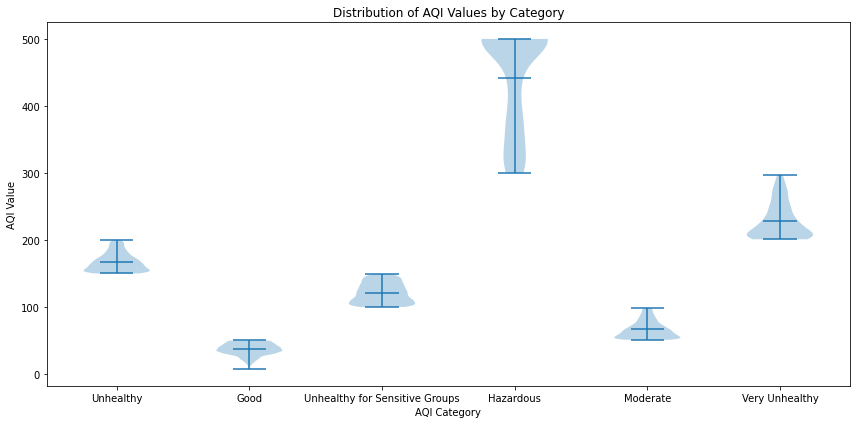

In [0]:
spark = SparkSession.builder.getOrCreate()
aqi_category_groups = df.groupBy('aqi_category').agg(collect_list('aqi_value').alias('aqi_values'))
aqi_category_pd = aqi_category_groups.toPandas()
aqi_category_dict = pd.Series(aqi_category_pd.aqi_values.values,index=aqi_category_pd.aqi_category).to_dict()
plt.figure(figsize=(12, 6))
plt.violinplot(aqi_category_dict.values(), showmeans=True)
plt.xlabel('AQI Category')
plt.ylabel('AQI Value')
plt.title('Distribution of AQI Values by Category')
plt.xticks(range(1, len(aqi_category_dict) + 1), aqi_category_dict.keys())
plt.tight_layout()
plt.show()

###Count of AQI Categories: Bar Chart

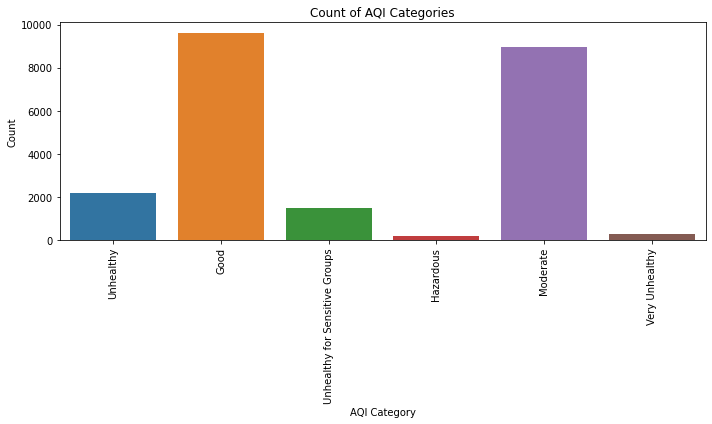

In [0]:
spark = SparkSession.builder.getOrCreate()
aqi_category_count = df.groupBy('aqi_category').agg(count('*').alias('count'))
aqi_category_pd = aqi_category_count.toPandas()
plt.figure(figsize=(10, 6))
sns.barplot(x=aqi_category_pd['aqi_category'], y=aqi_category_pd['count'])
plt.xlabel('AQI Category')
plt.ylabel('Count')
plt.title('Count of AQI Categories')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

###Average AQI by Country:Bar Chart

In [0]:
spark = SparkSession.builder.getOrCreate()
grouped_data = df.groupBy("country_name")
agg_data = grouped_data.agg(avg("aqi_value").alias("avg_aqi_value"))
top_10_countries = agg_data.sort(desc('avg_aqi_value')).limit(10)
top_10_countries_pd = top_10_countries.toPandas()
chart = alt.Chart(top_10_countries_pd).mark_bar().encode(
    x=alt.X('country_name', title="Country").sort('-y'),
    y=alt.Y('avg_aqi_value', title="Average AQI Value"),  # Updated to 'avg_aqi_value'
    tooltip=['country_name', 'avg_aqi_value']  # Updated to 'avg_aqi_value'
).properties(
    width=1000,
    height=500,
    title='Average AQI by Country'
).interactive()
chart


###Distribution of CO_AQI Values by Category: Box PLot

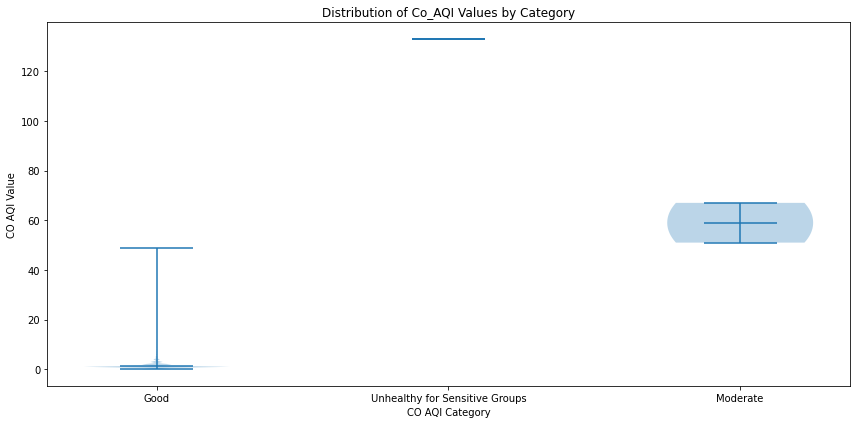

In [0]:
aqi_category_groups = df.groupby('co_aqi_category').agg(collect_list('co_aqi_value\t').alias('co_aqi_values'))
pd_df = aqi_category_groups.toPandas()
pd_df['co_aqi_values'] = pd_df['co_aqi_values'].apply(lambda x: [float(i) for i in x if i is not None])
aqi_category_dict = pd.Series(pd_df.co_aqi_values.values,index=pd_df.co_aqi_category).to_dict()
plt.figure(figsize=(12, 6))
plt.violinplot(aqi_category_dict.values(), showmeans=True)
plt.xlabel('CO AQI Category')
plt.ylabel('CO AQI Value')
plt.title('Distribution of Co_AQI Values by Category')
plt.xticks(range(1, len(aqi_category_dict) + 1), aqi_category_dict.keys())
plt.tight_layout()
plt.show()

##Average AQI Value by Continent: Choropleth Map 

<command-3401222349193148>:8: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


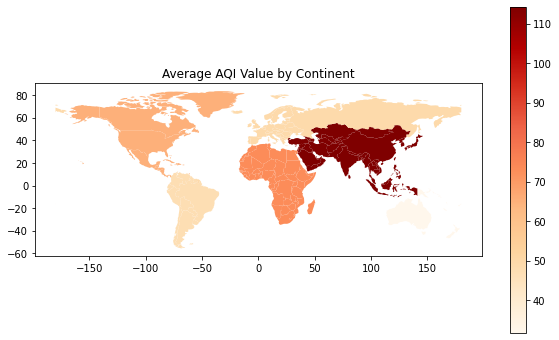

In [0]:
spark = SparkSession.builder.getOrCreate()
avg_aqi_by_continent = df.groupBy('continent').agg(avg('aqi_value').alias('avg_aqi_value'))
mode_aqi_category_by_continent = df.groupBy('continent', 'aqi_category').count()\
    .withColumn('rank', F.rank().over(Window.partitionBy('continent').orderBy(F.desc('count'))))\
    .filter('rank == 1').select('continent', 'aqi_category')
continent_summary = avg_aqi_by_continent.join(mode_aqi_category_by_continent, 'continent')
continent_summary_pd = continent_summary.toPandas()
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world = world.merge(continent_summary_pd, how='left', left_on='continent', right_on='continent')
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
world.plot(column='avg_aqi_value', cmap='OrRd', ax=ax, legend=True)
ax.set_title('Average AQI Value by Continent')
plt.show()



In [0]:
display(df)

country_name,city_name,aqi_value,aqi_category,co_aqi_value,co_aqi_category,ozone_aqi_value,ozone_aqi_category,no2_aqi_value,no2_aqi_category,pm25_aqi_value,pm25_aqi_category,continent
Russian Federation,Praskoveya,51,Moderate,1,Good,36,Good,0,Good,51,Moderate,Europe
Brazil,Presidente Dutra,41,Good,1,Good,5,Good,1,Good,41,Good,South America
Italy,Priolo Gargallo,66,Moderate,1,Good,39,Good,2,Good,66,Moderate,Europe
Poland,Przasnysz,34,Good,1,Good,34,Good,0,Good,20,Good,Europe
France,Punaauia,22,Good,0,Good,22,Good,0,Good,6,Good,Europe
United States of America,Punta Gorda,54,Moderate,1,Good,14,Good,11,Good,54,Moderate,North America
Germany,Puttlingen,62,Moderate,1,Good,35,Good,3,Good,62,Moderate,Europe
Belgium,Puurs,64,Moderate,1,Good,29,Good,7,Good,64,Moderate,Europe
Russian Federation,Pyatigorsk,54,Moderate,1,Good,41,Good,1,Good,54,Moderate,Europe
Egypt,Qalyub,142,Unhealthy for Sensitive Groups,3,Good,89,Moderate,9,Good,142,Unhealthy for Sensitive Groups,Africa


In [0]:
df.printSchema()

root
 |-- country_name: string (nullable = true)
 |-- city_name: string (nullable = true)
 |-- aqi_value: integer (nullable = true)
 |-- aqi_category: string (nullable = true)
 |-- co_aqi_value\t: integer (nullable = true)
 |-- co_aqi_category: string (nullable = true)
 |-- ozone_aqi_value: integer (nullable = true)
 |-- ozone_aqi_category: string (nullable = true)
 |-- no2_aqi_value: integer (nullable = true)
 |-- no2_aqi_category: string (nullable = true)
 |-- pm25_aqi_value: integer (nullable = true)
 |-- pm25_aqi_category: string (nullable = true)
 |-- continent: string (nullable = true)



In [0]:
df = df.withColumnRenamed('pm2.5_aqi_value', 'pm_aqi_value')
df = df.withColumnRenamed('pm2.5_aqi_category', 'pm_aqi_category')
df = df.withColumnRenamed('co_aqi_value\t', 'co_aqi_value')


In [0]:
df.where(col("country_name").isNull()).show()

+------------+---------+---------+------------+------------+---------------+---------------+------------------+-------------+----------------+--------------+-----------------+---------+
|country_name|city_name|aqi_value|aqi_category|co_aqi_value|co_aqi_category|ozone_aqi_value|ozone_aqi_category|no2_aqi_value|no2_aqi_category|pm25_aqi_value|pm25_aqi_category|continent|
+------------+---------+---------+------------+------------+---------------+---------------+------------------+-------------+----------------+--------------+-----------------+---------+
+------------+---------+---------+------------+------------+---------------+---------------+------------------+-------------+----------------+--------------+-----------------+---------+



In [0]:
df.where(col("city_name").isNull()).show()

+------------+---------+---------+------------+------------+---------------+---------------+------------------+-------------+----------------+--------------+-----------------+---------+
|country_name|city_name|aqi_value|aqi_category|co_aqi_value|co_aqi_category|ozone_aqi_value|ozone_aqi_category|no2_aqi_value|no2_aqi_category|pm25_aqi_value|pm25_aqi_category|continent|
+------------+---------+---------+------------+------------+---------------+---------------+------------------+-------------+----------------+--------------+-----------------+---------+
+------------+---------+---------+------------+------------+---------------+---------------+------------------+-------------+----------------+--------------+-----------------+---------+



In [0]:
print("Number of duplicate rows: ", df.count() - df.distinct().count())

Number of duplicate rows:  0


In [0]:
for col in df.columns:
    print(col, df.select(col).distinct().count())

country_name 170
city_name 22731
aqi_value 345
aqi_category 6
co_aqi_value 33
co_aqi_category 3
ozone_aqi_value 210
ozone_aqi_category 5
no2_aqi_value 58
no2_aqi_category 2
pm25_aqi_value 382
pm25_aqi_category 6
continent 6


In [0]:
df.groupBy('aqi_value').count().show()

+---------+-----+
|aqi_value|count|
+---------+-----+
|      148|   21|
|      243|    2|
|      392|    1|
|       31|  331|
|       85|   79|
|      137|   24|
|      251|    1|
|       65|  271|
|       53|  366|
|      481|    1|
|      255|    2|
|      133|   24|
|      472|    2|
|      296|    1|
|       78|  124|
|      321|    1|
|      362|    1|
|      375|    1|
|      155|   64|
|      108|   37|
+---------+-----+
only showing top 20 rows



###Distribution of AQI Values: Density Plot

/databricks/python/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


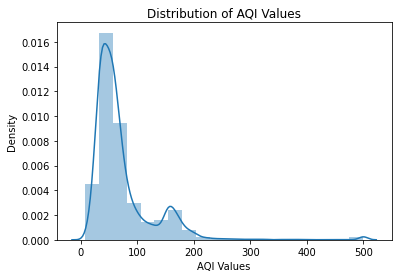

In [0]:
aqi_values = df.select('aqi_value').rdd.flatMap(lambda x: x).collect()
sns.distplot(aqi_values, bins=20, kde=True)
plt.xlabel('AQI Values')
plt.ylabel('Density')
plt.title('Distribution of AQI Values')
plt.show()